In [ ]:
!pip install transformers
!pip install datasets

In [ ]:
import spacy
from datasets import load_dataset
dataset = load_dataset("emotion")
spacy_eng = spacy.load("en_core_web_sm")

In [ ]:
def spacy_tokenizer(text, n_gram=1):
    if n_gram != 1:
        n_gram = n_gram-1
    spacy_text = spacy_eng.pipe(text)
    tokenized = []
    for sentence in spacy_text:
        tokenized.append(['[SOS]']*n_gram + [word.text.lower() for word in sentence if not (word.is_space or word.is_punct)] + ['[EOS]']*n_gram)
    return tokenized
    
def create_vocab(toknized_text, min_freq=1):
    c=1
    vocab = {'[UNK]':0, 0:'[UNK]'}
    freq = {}
    
    for words in toknized_text:
        for word in words:
            if word in freq:
                freq[word] += 1
            else:
                freq[word] = 1
    
    for key in freq:
        if freq[key] >= min_freq:
            vocab[key] = c
            vocab[c] = key 
            c+=1
    return vocab

In [ ]:
toknized_text = {'train':[], 'validation':[], 'test':[]}
for key in toknized_text:
    toknized_text[key] = spacy_tokenizer(dataset[key]['text'], 3)

In [ ]:
vocab = create_vocab(toknized_text['train'])
vocab_size = len(vocab)//2

In [ ]:
import numpy as np

emb_dim = 300
words = np.random.uniform(low=-1, high=1, size=(vocab_size, emb_dim))
contexts = np.random.uniform(low=-1, high=1, size=(vocab_size, emb_dim))
words.shape, contexts.shape 

((15168, 300), (15168, 300))

In [ ]:
def sigmoid(x):
    return 1/(1+np.exp(-x)) 

def loss(word, pos, neg): # neg -> []
    return -np.log(sigmoid(np.dot(pos,word))) - np.sum(np.log(sigmoid(np.dot(-neg,word))), axis=0) # check this

def update(word, pos, neg, lr):
    n_pos = pos - lr*(sigmoid(np.dot(pos,word))-1)*word
    n_neg = neg - lr*(np.expand_dims(sigmoid(np.dot(neg, word)), axis=1))*word
    n_word = word -  lr*((sigmoid(np.dot(pos, word))-1)*pos + np.sum(np.expand_dims(sigmoid(np.dot(neg, word)), axis=1)*neg, axis=0)) # check this
    return n_word, n_pos, n_neg

def merge(words, context):
    return words + context

In [ ]:
epoch = 32
lr = 1e-2
k_neg = 2
window_size = 5 
from pprint import pprint
# for e in range(epoch):

In [ ]:
from tqdm.notebook import tqdm
loop = tqdm(range(1,epoch+1), total=epoch)
loss_store = []
for e in loop:
    temp_loss = 0
    for tokenized_sentence in toknized_text['train']: # if one word present more than once, then it will not work
        size = len(tokenized_sentence)
        window = min(size, window_size) # if the sentence itself is smaller than the window the whole is the window
        if window % 2 == 0 :
            window -= 1  
        for i in range(size-window+1):
            context = {'pos':[],'neg':[]} # for each pos words, k_neg words => { 'pos':[], 'neg':[[]] }
            target = mid = i + (window//2)
            context['pos'] = list(range(i, mid)) + list(range(mid+1,i+window))
            target_v_id = vocab[target]
            for _ in range(window-1):
                neg_context = []
                for _ in range(k_neg):
                    while True: # picking randomly a vocab index
                        neg_v_id = np.random.randint(0, vocab_size-1)
                        if target_v_id != neg_v_id:
                            break
                    neg_context.append(neg_v_id)
                context['neg'].append(neg_context)

            # ------------
            for id in range(window-1):
                word = words[target]
                pos = contexts[context['pos'][id]]
                neg = contexts[context['neg'][id]]
                l = loss(word, pos, neg)
                temp_loss += l
                words[target], contexts[context['pos'][id]], contexts[context['neg'][id]] = update(word, pos, neg, lr)
            # ------------ 
    loop.set_description(f'Epoch [{e}/{epoch}]')
    loop.set_postfix(loss=f'{temp_loss:.3f}')
    loss_store.append(temp_loss)
    if e>10 and e % 8==0:
        lr /= 10

  0%|          | 0/32 [00:00<?, ?it/s]

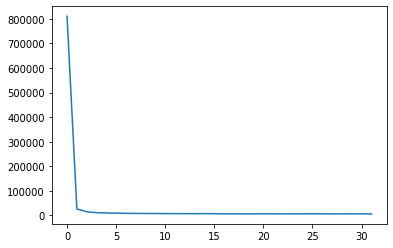

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(loss_store)
plt.show()

### Evaluation
[Kaggle TSNE](https://www.kaggle.com/code/jeffd23/visualizing-word-vectors-with-t-sne/notebook)

In [ ]:
from sklearn.manifold import TSNE

def tsne_plot(embedding, vocab):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    # for word in model.wv.vocab:
    #     tokens.append(model[word])
    #     labels.append(word)
    for key, val in vocab.items():
    # for val in ['good', 'bad', 'well']:
        if isinstance(val, str):
            tokens.append(embedding[vocab[val]])
            labels.append(val)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=3000, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(100, 100)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


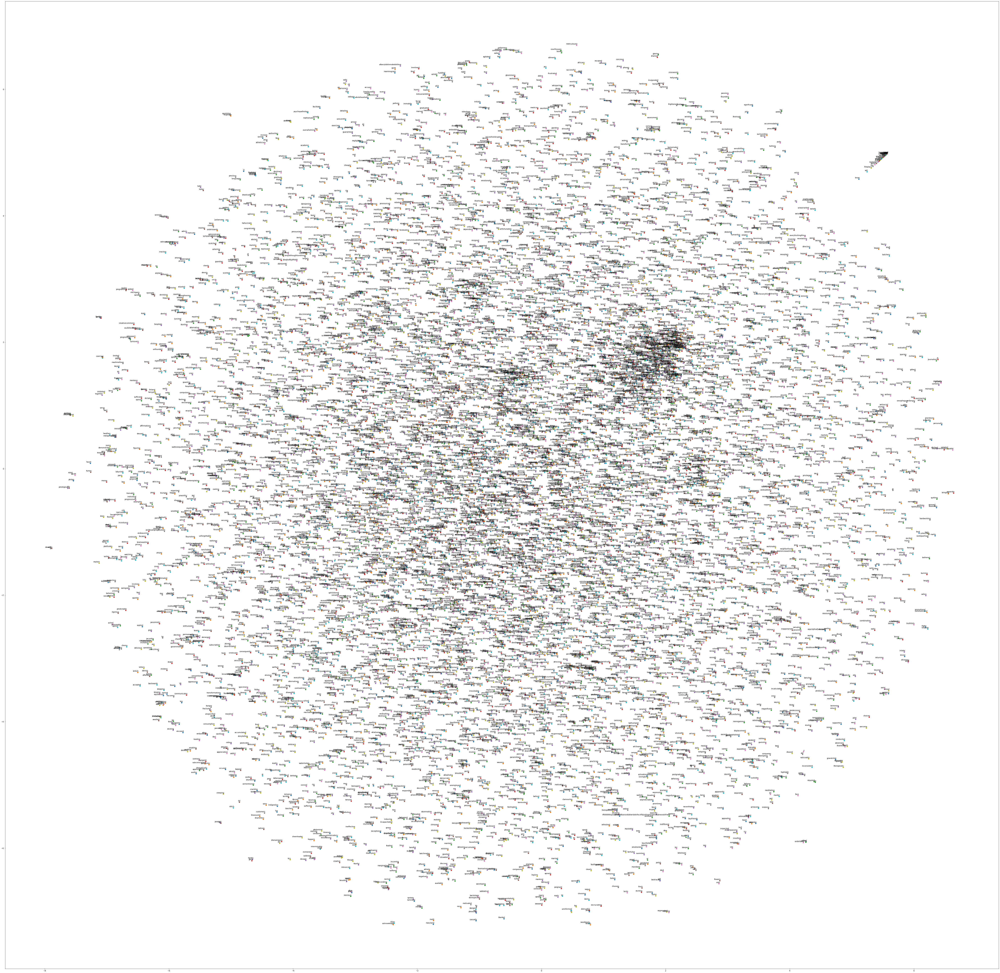

In [ ]:
# tsne_plot(words+context, vocab)
tsne_plot(words, vocab)

In [ ]:
!wget http://alfonseca.org/pubs/ws353simrel.tar.gz
!tar -xzvf ws353simrel.tar.gz
with open('wordsim353_sim_rel/wordsim_similarity_goldstandard.txt', 'r') as f:
    temp = f.readlines()
pairs = {}
for line in temp:
    t = [i.strip() for i in line.split()] 
    pairs[(t[0],t[1])] = float(t[2])
del temp

In [ ]:
import torch
from numpy.linalg import norm
import numpy as np
def get_score(word1, word2): # cosine similarity
    return np.dot(words[vocab.get(word1, 0)],words[vocab.get(word2, 0)])/(norm(words[vocab.get(word1, 0)])*norm(words[vocab.get(word2, 0)]))

In [ ]:
def transform_to_10(x):
    OldRange = (1 - -1)  
    NewRange = (10 - 0)  
    NewValue = (((x - -1) * NewRange) / OldRange) + 0
    return NewValue

In [ ]:
for key, val in pairs.items():
    score = get_score(key[0], key[1])
    print(round(transform_to_10(score), 2), val)

5.05 7.35
10.0 10.0
5.37 5.77
4.99 6.31
5.18 6.77
5.34 7.42
4.44 6.19
5.46 5.92
4.59 7.0
4.58 6.62
5.07 6.81
5.09 5.81
5.0 7.73
5.05 9.15
4.17 8.58
4.76 5.92
4.92 6.69
4.87 9.44
5.31 9.03
5.48 6.81
4.79 6.63
10.0 2.5
5.19 7.35
10.0 8.46
4.99 8.13
4.86 6.87
4.92 8.94
10.0 8.96
4.35 9.29
5.13 8.83
5.38 9.1
4.78 8.87
5.01 9.02
5.74 9.29
10.0 8.79
5.08 7.52
4.86 7.1
4.78 7.38
5.36 4.42
5.22 8.42
4.98 9.04
4.8 8.0
4.8 8.0
4.8 7.08
4.8 6.85
5.03 7.0
4.8 4.77
4.8 5.62
5.46 8.08
5.03 6.71
4.86 5.58
5.21 8.45
4.87 8.08
5.09 8.02
5.19 5.85
10.0 6.04
5.57 6.85
5.57 2.92
5.47 3.69
5.57 2.15
4.93 7.42
4.92 7.27
4.58 8.66
4.93 6.22
10.0 6.5
4.88 7.59
5.22 7.56
4.86 5.0
10.0 8.13
4.96 4.63
4.87 7.88
5.08 5.0
4.68 8.97
5.44 6.44
5.15 8.88
5.78 6.88
5.19 7.81
10.0 7.63
10.0 8.44
4.53 7.63
5.36 7.78
5.04 9.22
4.7 7.13
4.8 7.89
4.65 7.47
4.44 8.34
5.13 8.7
4.95 7.81
5.0 5.7
5.27 8.36
4.81 8.3
5.16 5.25
4.77 8.53
4.98 6.88
10.0 7.44
5.2 5.56
4.47 7.83
4.84 7.59
5.32 7.19
4.96 6.31
10.0 5.0
5.27 5.0
4.71 4